In [1]:
import torch
from diffusers.utils import load_image, make_image_grid
import numpy as np
from PIL import Image
import os
import glob
import cv2
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import tensorflow as tf
from tensorflow import keras
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import pandas as pd
import plotly.express as px
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.cluster import FeatureAgglomeration
from sklearn.manifold import Isomap
import umap

c:\Users\Will Poulett\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\Will Poulett\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
c:\Users\Will Poulett\AppData\Local\Pr

In [2]:
image_paths = []

for folder in os.listdir("test_images"):
    fileList = glob.glob(f'test_images/{folder}/*')
    image_paths.extend(fileList)

In [3]:
images_array = []
images = []

for file in image_paths:
    im = cv2.imread(file)
    if "edge_case_images" not in file:
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (256,256))
    images_array.append(im)
    images.append(Image.fromarray(im.astype(np.uint8)))

In [4]:
len(images)

216

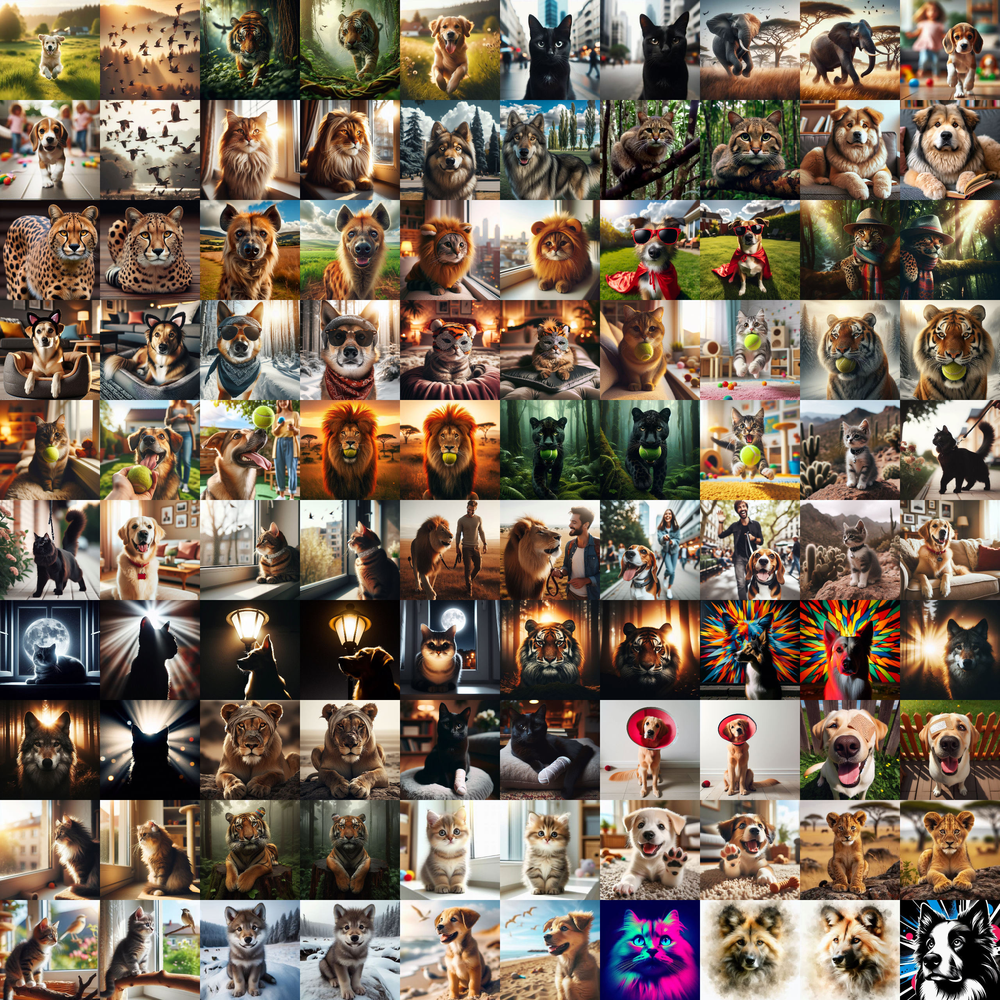

In [5]:
image_grid = make_image_grid(images[0:100],10, 10)
image_grid

In [6]:
model = keras.models.load_model("model/models/best_model_epoch_05.h5")
activations_model = keras.Model(model.input,model.layers[-2].output)

In [7]:
predictions = model.predict(np.array(images_array))
predictions_argmax = [np.argmax(pred) for pred in predictions]
activations = activations_model.predict(np.array(images_array))

7/7 [==============================] - 12s 1s/step


In [8]:
projections = TSNE(2,random_state=1).fit_transform(np.stack(activations))
TSNE_x = [x[0] for x in projections]
TSNE_y = [x[1] for x in projections]

projections = PCA(2,random_state=1).fit_transform(np.stack(activations))
PCA_x = [x[0] for x in projections]
PCA_y = [x[1] for x in projections]

projections = FeatureAgglomeration(n_clusters=2).fit_transform(np.stack(activations))
FA_x = [x[0] for x in projections]
FA_y = [x[1] for x in projections]

projections = Isomap(n_components=2).fit_transform(np.stack(activations))
IS_x = [x[0] for x in projections]
IS_y = [x[1] for x in projections]

projections = umap.UMAP().fit_transform(np.stack(activations))
UM_x = [x[0] for x in projections]
UM_y = [x[1] for x in projections]

In [9]:
from bokeh.plotting import output_notebook

# Ensure Bokeh outputs to the notebook
output_notebook()

c = ["blue", "green", "red"]
v = ["Cat", "Dog", "Wild"]
DR_techniques = ["T-SNE", "PCA", "FeatureAgglomeration", "IsoMap", "UMap"]

colours = [c[p] for p in predictions_argmax]
labels  = [v[p] for p in predictions_argmax]

from utils.plotting_utils import RISE_tool

coordinates_list = [dict(x=TSNE_x, y=TSNE_y),
                    dict(x=PCA_x,  y=PCA_y),
                    dict(x=FA_x,y=FA_y),
                    dict(x=IS_x,y=IS_y),
                    dict(x=UM_x, y=UM_y)]

RISE_tool(coordinates_list=coordinates_list,
          labels = labels,
          image_paths = image_paths,
          colours = colours,
          DR_techniques=DR_techniques)

Loading BokehJS ...